### Homework No:2
#### Text Analytics
*Name : Scariah Anoop Kunjumon<br>
ID : 1001757408*<br>
***a) Preprocessing the data <br>
b) Performing unsupervised learning algorithms on the data: Multidimensional Scaling, Hierarchical Clustering, and K-Means to find do they yield similar results.<br>
c) Performing Topic Modeling: Obtain 5 topics using three different algorithms, namely, NMF, LSA/LSI, and LDA.***

In [1]:
import os
import string
import pandas as pd
import glob as glob
from sklearn.manifold import MDS
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import spacy
import nltk
from nltk.corpus import stopwords
from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import ward, dendrogram
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import NMF
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
from sklearn.decomposition import TruncatedSVD

In [2]:
nlp = spacy.load("en_core_web_sm")

***Loading Data***

In [3]:
os.chdir('D:\masters\DATASCIENCE\Projects\Text Analysis\dataset\Patents_xls')
files = glob.glob('*xlsx')
files

['Apple.xlsx',
 'Google.xlsx',
 'HTC.xlsx',
 'Huawei.xlsx',
 'InterDigital.xlsx',
 'Kodak.xlsx',
 'LG.xlsx',
 'Nokia.xlsx',
 'Oracle.xlsx',
 'Pantech.xlsx',
 'Samsung.xlsx',
 'Sony Ericsson.xlsx',
 'ZTE.xlsx']

In [4]:
for f in files:
    df = pd.read_excel(f)
    #preprocessing to remove NULL value in the following columns of title and abstract
    df["TI"].fillna("", inplace = True)
    df["AB"].fillna("", inplace = True)
    #converting the dataframe to list to further process 
    titles = list(df['TI'])
    abstracts = list(df['AB'])
    all_text= [i + j for i, j in zip(titles, abstracts)]
    #joining all the list elements with a space into a single text file
    final_text= " ".join(all_text)
    #saving to a local file
    filename = "D:\masters\DATASCIENCE\Projects\Text Analysis\dataset\Preprocessed_txt\ " +f.split(".")[0]+ ".txt"
    with open(filename, "w+", encoding='utf-8', errors='ignore') as outfile:
        outfile.write(final_text)

In [5]:
os.chdir('D:\masters\DATASCIENCE\Projects\Text Analysis\dataset\Preprocessed_txt')
txt_files = glob.glob('*txt')
txt_files = [x.strip() for x in txt_files]  #remvoing space in list
txt_files

['Apple.txt',
 'Google.txt',
 'HTC.txt',
 'Huawei.txt',
 'InterDigital.txt',
 'Kodak.txt',
 'LG.txt',
 'Nokia.txt',
 'Oracle.txt',
 'Pantech.txt',
 'Samsung.txt',
 'Sony Ericsson.txt',
 'ZTE.txt']

***Creating Corpus***

In [6]:
path = 'D:\masters\DATASCIENCE\Projects\Text Analysis\dataset\Preprocessed_txt\ '
corpus = []
for fname in txt_files:
    with open(path + fname, 'r', encoding='utf-8', errors='ignore') as textfile:
        corpus.append(textfile.read())
len(corpus)

13

***Data Preprocessing***

In [7]:
def perprocess(text):
    nlp.max_length = len(text)
    stopwords = nltk.corpus.stopwords.words("english")
    # Preprocessing by removing Uppercase and removing the punctuation & digits
    raw_text = text.lower() #coverting to lower case
    exclude_list = string.digits + string.punctuation #removing the punctuation & digits
    # Lemmatization
    table = str.maketrans(exclude_list,len(exclude_list)*" ")
    raw_text = raw_text.translate(table)
    doc = nlp(raw_text, disable = ['ner', 'parser']) #Loading into the 'en model' Lemmatization
    lemmatized_output = " ".join([token.lemma_ for token in doc]) #Lemmatize list of words and join
    # Removing Stopwords
    words = lemmatized_output.split()
    clean_text = " ".join([w for w in words if w not in stopwords])
    return clean_text

clean_corpus =[]
for text in corpus:
    clean_corpus.append(perprocess(text))
    clean_corpus=list(map(lambda st: str.replace(st,'-PRON-',''), clean_corpus)) #removing string -PRON- 
clean_corpus

['method system managing datasystem method manage datum metadata one exemplary method metadata file create several different software application capture capture metadata search type information metadata one type file differ type information metadata another type file method describe datum processing system machine readable medium also describe system method integrate medium objectssystem method integrate medium object view manipulation via computing device personal computer system method may provide via application program interface api provide function allow application program create scene add media object scene method include prepare translation vector rotation matrix medium object define orientation location medium object scene scene include medium object display interface provide user may manipulate scene object therein system method may implement personal computer compute device method calibrate tone base communication systemselectronic device accessory headset electronic device

In [8]:
len(clean_corpus) # Confirming the data is not lost and corpus is created correctly 

13

### Performing Unsupervised Learning

In [9]:
vectorizer = TfidfVectorizer(stop_words = 'english', min_df = 2)
dtm = vectorizer.fit_transform(clean_corpus)
similarity = cosine_similarity(dtm)
cos_distance = 1 - similarity #cosine distance

***Multidimensional Scaling Algorithm***

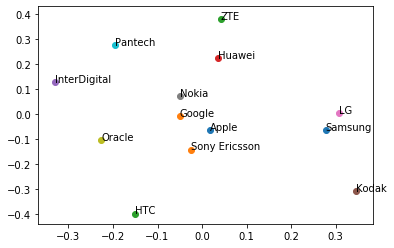

In [10]:
mds = MDS(n_components = 2, dissimilarity='precomputed', random_state=999)
pos = mds.fit_transform(cos_distance)
xs, ys = pos[:,0], pos[:,1]
os.chdir('D:\masters\DATASCIENCE\Projects\Text Analysis\dataset\Patents_xls')
files = glob.glob('*xlsx')
names = []
for f in files:
    names.append(f.split(".")[0]) 
for x, y, name in zip(xs, ys, names):
    plt.scatter(x, y)
    plt.text(x, y, name)
plt.show()

***Hierarchical Clustering***

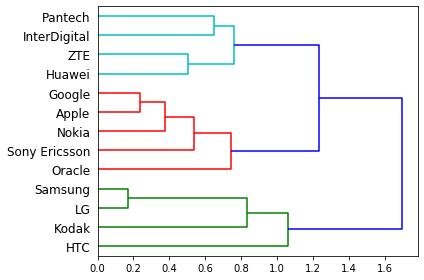

In [11]:
linkage_matrix = ward(cos_distance)
dendrogram(linkage_matrix, orientation='right', labels=names)
plt.tight_layout()
plt.show()

***K-Means***

In [12]:
from sklearn.cluster import KMeans
vectorizer = TfidfVectorizer()
km = KMeans(n_clusters=5, random_state=999)
cluster_solution = km.fit(dtm) 
cluster_membership = km.predict(dtm)
doc_distance_to_center = km.transform(dtm)
clusters = zip(cluster_membership, names)
top_docs = {'docs': names, 'cluster': cluster_membership,
            'doc_to_0':doc_distance_to_center[0:,0],
            'doc_to_1':doc_distance_to_center[0:,1],
            'doc_to_2':doc_distance_to_center[0:,2],
            'doc_to_3':doc_distance_to_center[0:,3],      
            'doc_to_4':doc_distance_to_center[0:,4],
           }
df = pd.DataFrame(top_docs)
df.sort_values(by=['cluster']) #sorting by clustering to find the similarity between different companies

,docs,cluster,doc_to_0,doc_to_1,doc_to_2,doc_to_3,doc_to_4
3,Huawei,0,0.365714,0.924919,0.855421,0.634964,1.077197
12,ZTE,0,0.365714,1.021038,0.888850,0.779415,1.154079
5,Kodak,1,1.099997,0.550237,1.029603,0.930532,1.120426
6,LG,1,0.943252,0.379065,0.875087,0.806113,1.038999
10,Samsung,1,0.946933,0.322801,0.877853,0.775522,1.001210
9,Pantech,2,0.870333,0.971242,0.368837,0.793427,1.068914
11,Sony Ericsson,2,0.876875,0.832262,0.368837,0.623683,0.825442
0,Apple,3,0.798748,0.735204,0.718607,0.398859,0.899990
1,Google,3,0.719189,0.782285,0.656606,0.312863,0.930444
4,InterDigital,3,0.832445,0.991454,0.866669,0.623028,1.103145


*The above 3 algorithms yield similar result for the patent dataset and we can find that companies like **Google, Apple ,Sony Ericsson and Nokia** have a close similarity in their patents*

### Topic Modeling

In [13]:
# function to display the topics
def display_topics(model, feature_names, n_top_words,model_name):
    topics = []
    for idx, topic in enumerate(model.components_):
        print("Topic %d:" % (idx))
        print(" ".join([feature_names[i]for i in topic.argsort()[:-n_top_words - 1:-1]]))
        topics.append(" ".join([feature_names[i]for i in topic.argsort()[:-n_top_words - 1:-1]]))
    compare_dict(topics,model_name)

In [14]:
# function to create a dict for analysing the topics found by different algorithms 
compare_topics = {}
def compare_dict(topics,model_name):
    compare_topics.update({model_name : topics})

***Non-negative matrix factorization (NMF)***

In [15]:
#Non-negative matrix factorization (NMF)
topic_words = []
n_features = 10000
num_topics= 5
num_top_words = 20

NMF_vectorizer = TfidfVectorizer(stop_words = 'english', max_df=0.95, min_df=2, max_features = n_features)
NMF_dtm = NMF_vectorizer.fit_transform(clean_corpus)
NMF_feature_names = NMF_vectorizer.get_feature_names()
NMF_clf = NMF(n_components = num_topics, random_state=999).fit(NMF_dtm)
display_topics(NMF_clf, NMF_feature_names, num_top_words,model_name = "NMF")

Topic 0:
object application image associate store computer message embodiment node document content file client query database element item storage display packet
Topic 1:
electrode layer image display substrate light pixel line gate liquid crystal organic region film semiconductor color surface pattern material panel
Topic 2:
packet message gateway forward optical say multicast node roam group subscriber label equipment media implement realize pseudo key protocol obtain
Topic 3:
electronic display portable antenna remote image body hinge host audio housing slide surface connector element board tone member camera handheld
Topic 4:
code antenna estimate receiver matrix node spread sample rate bit ap symbol beam message multiple level noise transmitter phase midamble


***Latent Dirichlet Allocation (LDA)***

In [16]:
lda_vectorizer = CountVectorizer(stop_words = 'english', max_df=0.95, min_df=2, max_features = n_features)
lda_dtm = lda_vectorizer.fit_transform(clean_corpus)
lda = LatentDirichletAllocation(n_components=num_topics,learning_method='batch', max_iter=5, random_state=999).fit(lda_dtm)
feature_names = lda_vectorizer.get_feature_names()
display_topics(lda, feature_names, num_top_words,model_name = "LDA")

Topic 0:
layer substrate electrode semiconductor display light line region gate pattern image surface transistor source film pixel drive area insulate bit
Topic 1:
application object embodiment store associate computer message image node database file document client storage display content packet query electronic source
Topic 2:
display liquid crystal line electrode record substrate gate body washing pixel layer recording plasma drive panel optical structure battery surface
Topic 3:
layer display electrode substrate image line pixel crystal liquid light gate region film panel record area drive surface pattern organic
Topic 4:
message element antenna packet display say electronic node code image receiver content frame application program location associate portable store equipment


***Latent Semantic Analysis/Indexing (LSA/LSI)***

In [17]:
lsi_vectorizer = CountVectorizer(max_df= 0.95, min_df = 2,stop_words='english', lowercase=True)
lsi_dtm = lsi_vectorizer.fit_transform(corpus)
lsi = TruncatedSVD(n_components= num_topics, n_iter = 5).fit(lsi_dtm)
feature_names = lsi_vectorizer.get_feature_names()
display_topics(lsi, feature_names, num_top_words,model_name = "LSI")

Topic 0:
layer substrate display electrode light semiconductor gate image line region provided forming pattern film surface pixel liquid crystal source panel
Topic 1:
liquid crystal display recording electrode pixel washing panel air battery optical driving common plasma water disc medium lcd line machine
Topic 2:
application associated computer database content message node object embodiment electronic media provided client file resource multiple packet received systems web
Topic 3:
database application object resource execution transaction virtual thread xml code electrode cache client semiconductor test instruction gate objects substrate chip
Topic 4:
image color images printing material media camera sensor liquid fluid ink pixels imaging light charge file print embodiment capture printer


***Analysing the 5 topic found out by different algorithms***

In [18]:
dfcom=pd.DataFrame(compare_topics)
dfcom

,NMF,LDA,LSI
0,object application image associate store compu...,layer substrate electrode semiconductor displa...,layer substrate display electrode light semico...
1,electrode layer image display substrate light ...,application object embodiment store associate ...,liquid crystal display recording electrode pix...
2,packet message gateway forward optical say mul...,display liquid crystal line electrode record s...,application associated computer database conte...
3,electronic display portable antenna remote ima...,layer display electrode substrate image line p...,database application object resource execution...
4,code antenna estimate receiver matrix node spr...,message element antenna packet display say ele...,image color images printing material media cam...


*from the above comparison we can say that there is a **similarity** between the 5 topics found by all the 3 alogrithms*